# 여러 컴퓨터 시각 작업  
* 의미적 분리  
* 분류 + 위치 찾기  
* 물체 탐지  
* 인스턴스 분리  


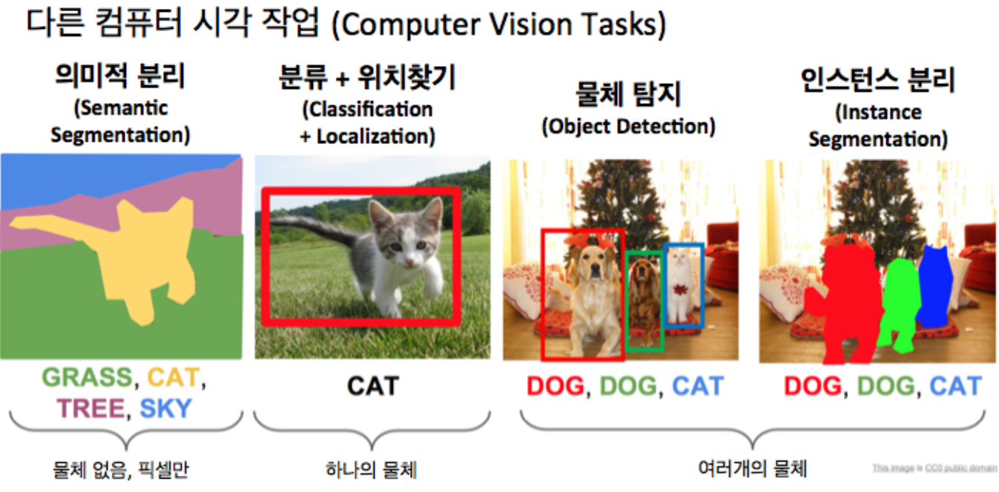

Semantic Segmentation: 이미지를 입력하고 모든 픽셀에 대해 카테고리를 결정하고 싶은 것.  
여기선 인스턴스를 구별하는 것이 아님.  
슬라이딩 윈도우 아이디어로 전체 이미지에서 조각을 추출하여 CNN으로 픽셀을 분류함.  

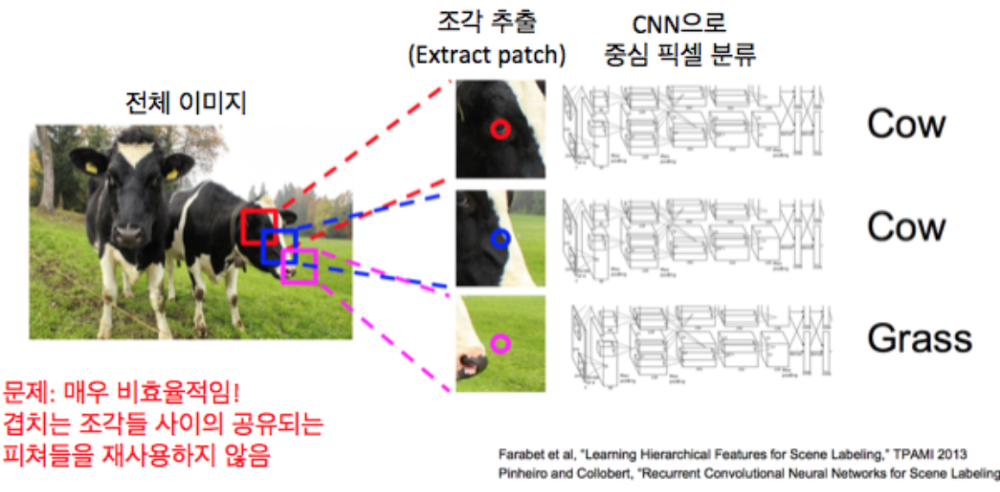

픽셀 하나하나를 라벨링하려고 해서 수퍼 비싸짐.   

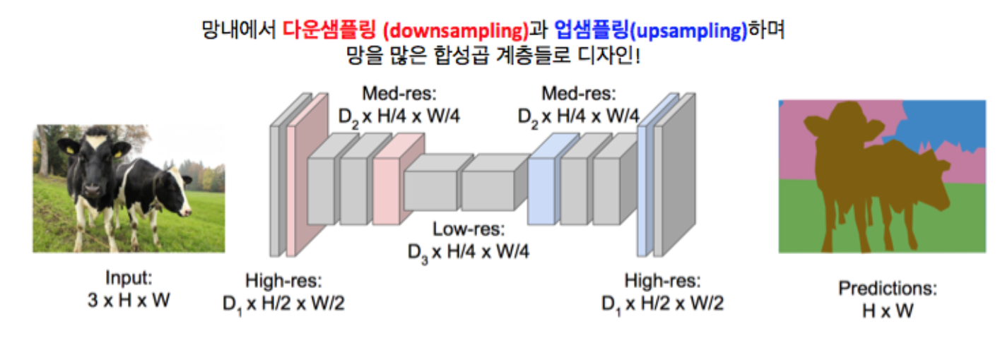

완전합성곱망 아이디어도 있는데 이는 원본 이미지를 합성곱하는 것이기 때문에 비용이 매우 비쌈  
그래서 나온 것이 위처럼 망내에서 다운샘플링과 업샘플링을 해주는 것.

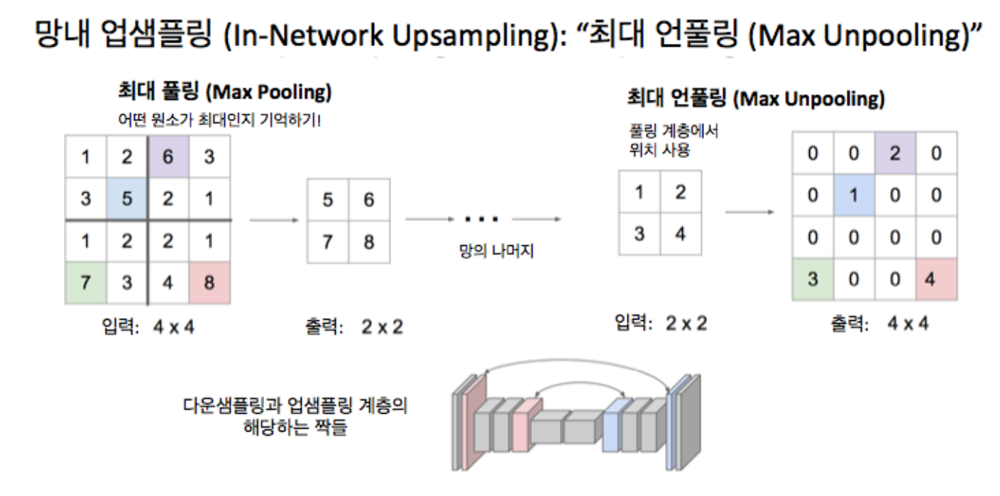

여기서 업샘플링(언풀링)을 집중적으로 다루는데  
최대풀링을 할 때 어디서 값을 가져왔는지 기억했다가  
업샘플링할 때 대칭적으로 똑같은 자리에 값을 넣어줄 수 있다는 내용이다.  


스트라이드 x로 스트라이드가 있는 합성곱을 하면 피쳐 맵은 결국 2의 인수로 어떤 학습을 하게 되는 방식으로 다운샘플링됨.

### 학습가능한 업샘플링: 전치 합성곱  
3x3 전치 합성곱, 스트라이드 2 패딩 1  
전치 합성곱은 내적을 취하는 대신에 입력 피쳐 지도의 왼쪽 위부터 값을 취한다. 그러고 3x3영역에 복사한다. -> 입력이 가중치고 이것으로 필터에 가중치 부여.

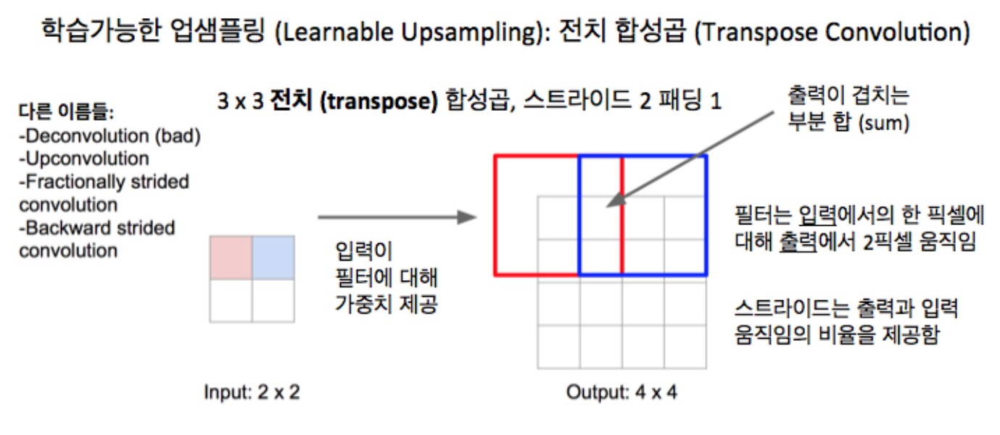

Deconv 빼고는 다 괜찮은 이름들임  
여기서 내가 제일 마음에 드는 것은 Backward strided convolution!  
전치 합성곱의 순방향 전달이 일반적인 합성곱의 반대가 아니라 역방향 전달이 되는 것이기 때문!  
여기서 주의할 점은 전치 합성곱에서 stride가 1이면 그냥 합성곱과 근본적으로 같다는 점!

## 분류 + 위치 찾기

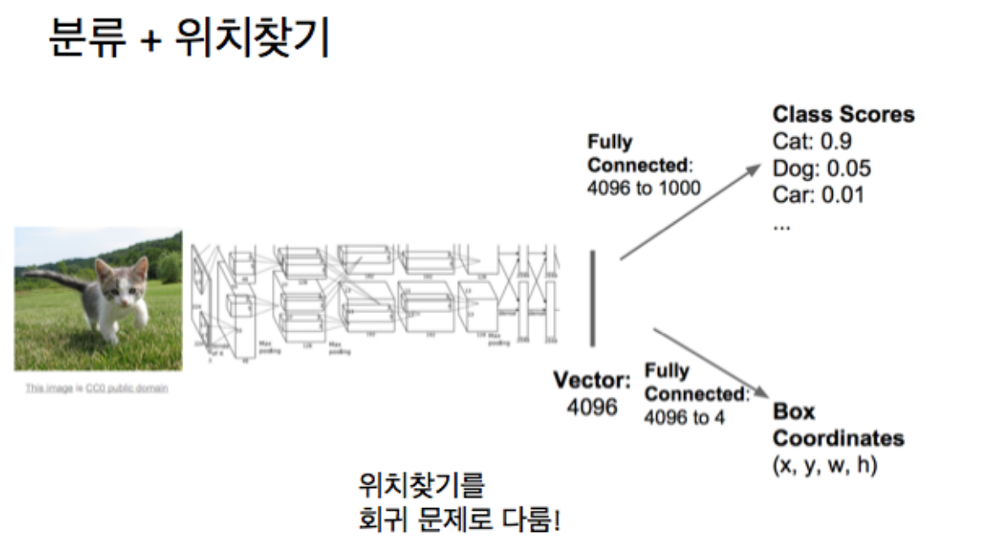

클레스 점수와 바운딩 박스 할 위치 출력

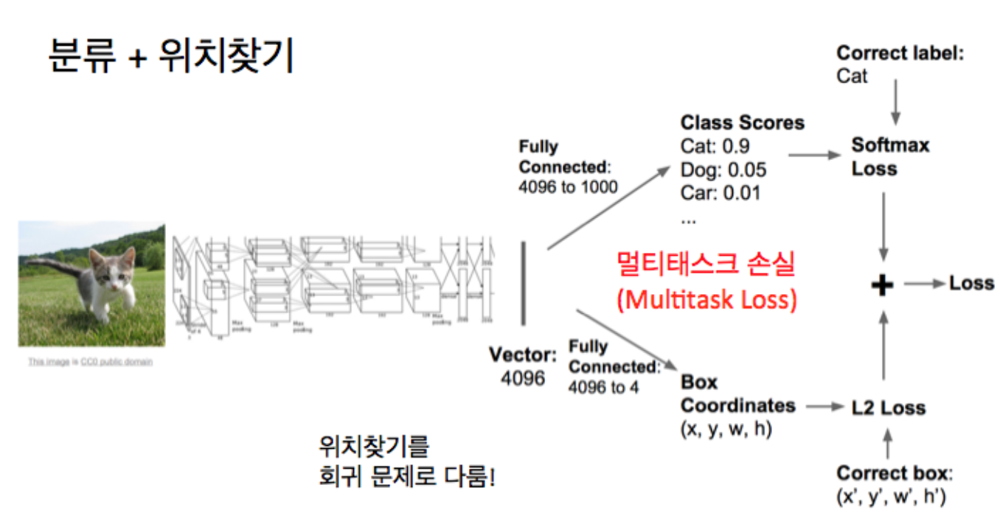

여기서 지도 학습이 가미됨  
클레스 점수에 대한 loss, 경계상자에 대한 loss 그리고 종합 loss까지

## Object Detection

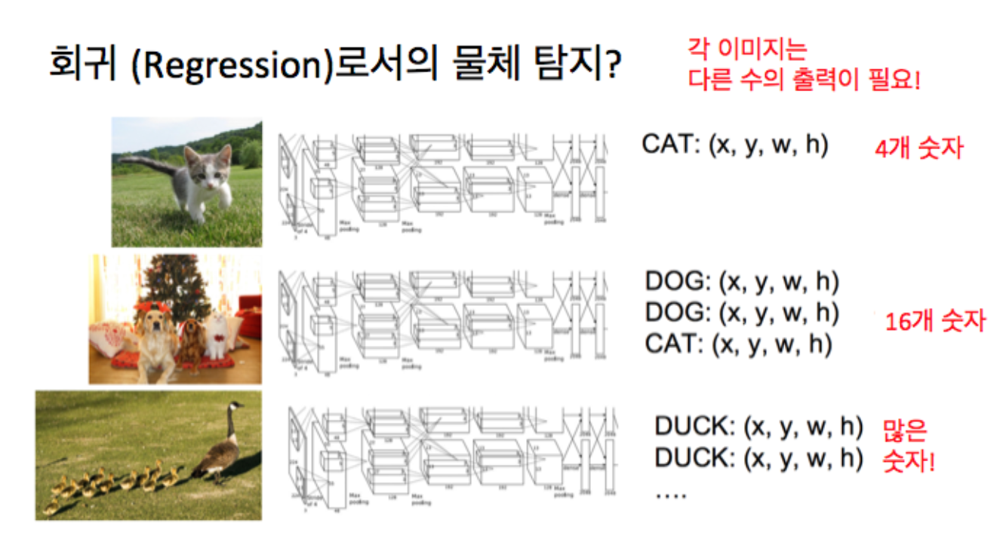

객체탐지는 위치 탐지와 많이 다름.  
다양한 물체가 있고 미리 몇 개를 찾아야 하는 지 모르는 상황이기 때문.->회귀 문제로 생각하면 어려움

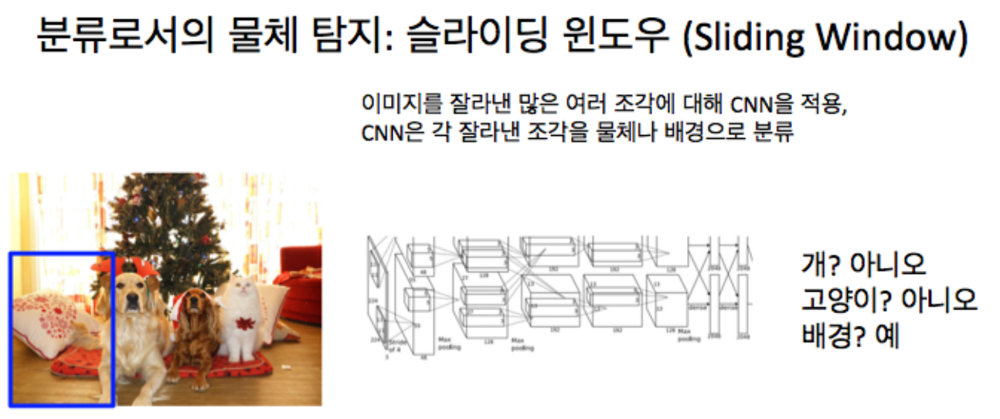

그래서 아까 배운 작은 조각들로 의미적 분리를 하는 아이디어와 비슷한 슬라이딩 윈도우를 사용함  
-> 여기서 문제점 어떻게 자를건데?

그래서 나온 것이  
### 영역 제안

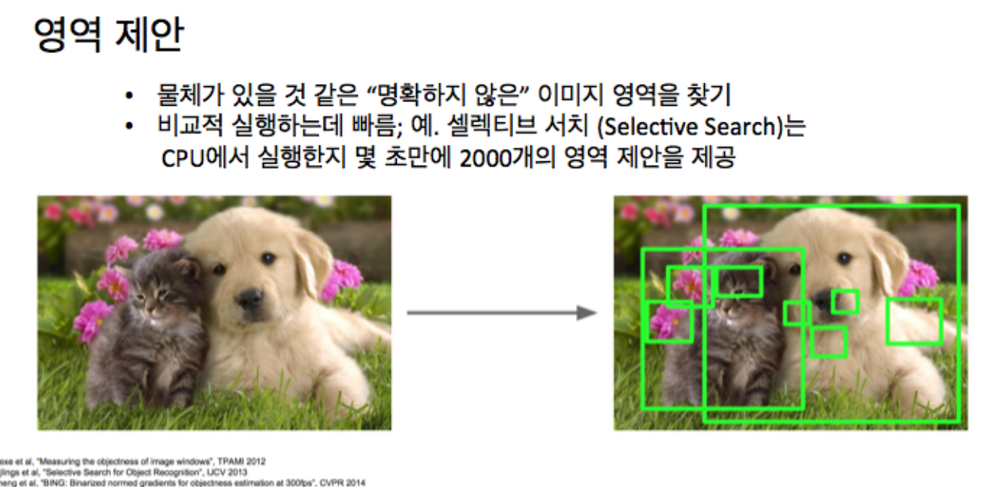

이건 딥러닝을 사용하는 것이 아님.  
2초면 2000개의 영역 제안  
많은 노이즈가 있지만 재현율이 꽤 높음!  
이 아이디어는 R-CNN 논문에 나옴

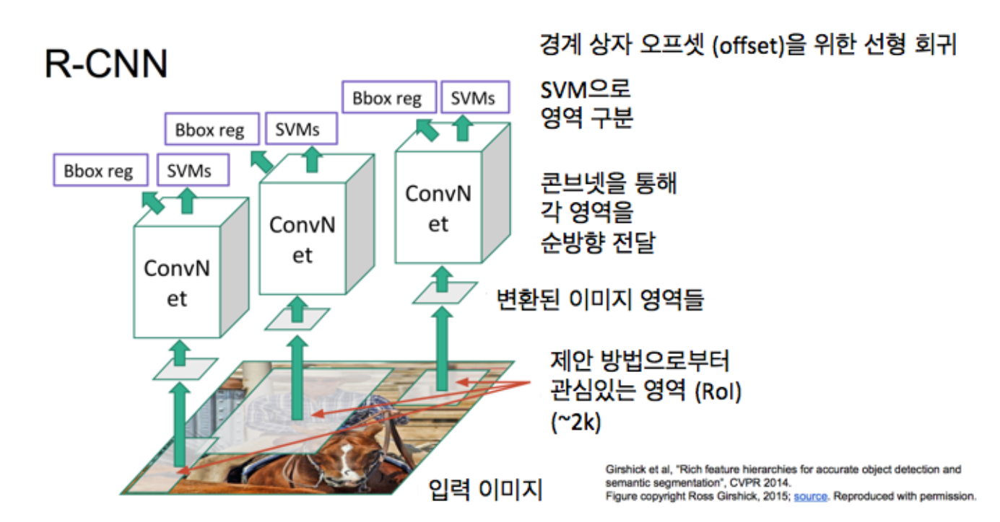

* 2000개의 관심 영역을 제안받고  
* 제안영역을 잘라낸 후 고정된 크기로 변환하고  
* 각각을 합성곱 망을 통과시키고  
* SVM을 사용해서 분류(카테고리 예측)  
영역 제안이 완벽하지 않을 수도 있다는 문제가 있어서 카테고리 레이블 뿐만 아니라 영역 제안 단계에서 예측 되었던 박스에 대한 오프셋이나 수정 같은 4개의 숫자도 예측  



R-CNN: 문제점  
* 상황에 따른 훈련 목표  
* 훈련 느림, 많은 디스크 공간 차지  
* 추론(탐지) 느림

## 그래서 나온 것이 빠른 R-CNN 

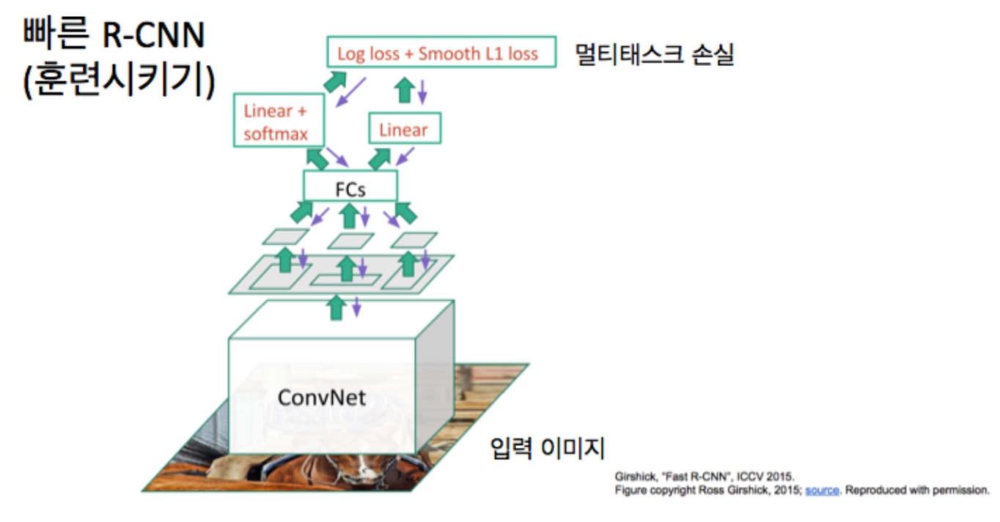

전체 이미지를 합성곱 계층들을 한 번 통과 시기고,  
영역 제안에 해당하는 이미지의 픽셀들을 잘라내는 대신, 그 영역 제안들을 합성곱 피쳐map에 사영 -> 합성곱 피처 지도로부터 cut -> 재사용 가능,  
완전 연결 계층에 알맞는 크기로 바꿔줌(관심영역 풀링 계층),  
소프트맥스 분류기로 분류 점수와 경계-상자 회귀 오프셋 예측 가능,  
마지막으로 합친 것이 멀티태스크 loss + 역전파로 학습 가능

위에서 설명한 빠른 R-CNN은 영역 제안 계산에서 병목현상이 발생함.  
그래서 나온 것이 더 빠른 R-CNN

여태까지 본 것들이 R-CNN 방법족임.  
이제 볼 것은 다른 방법족인 YOLO나 SSD 같은 제안 없이 탐지

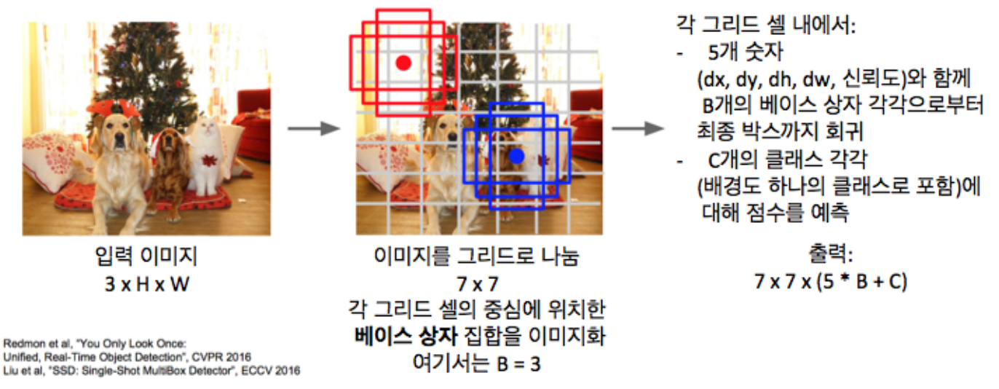

YOLO: You Only Look Once  
SSD: Single Show Detection  
입력 이미지가 주어지면, 그리드로 나누어 여러 개의 경계박스 집합을 사용해 분석

CVPR에 있는 Speed/accuracy trade-offs for modern convolutional object detectos 보기

## 인스턴스 분리

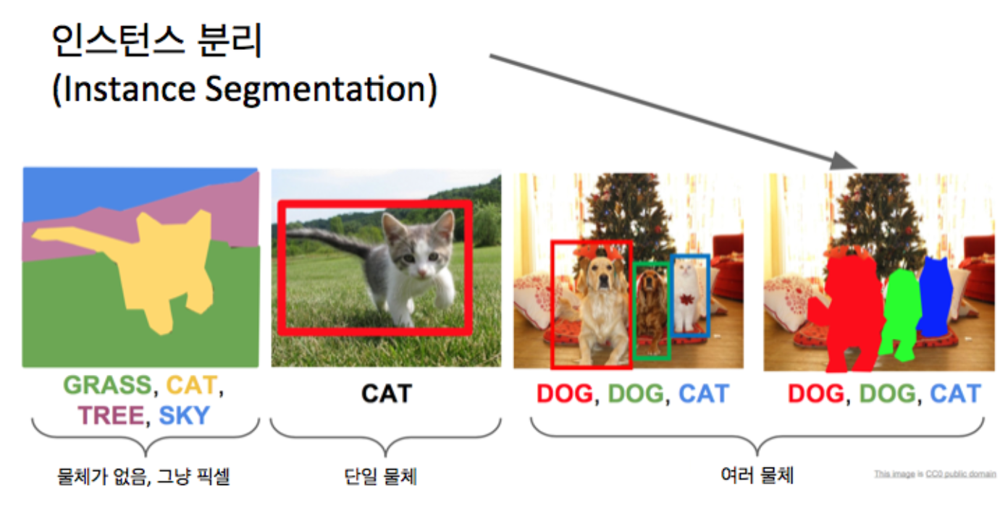

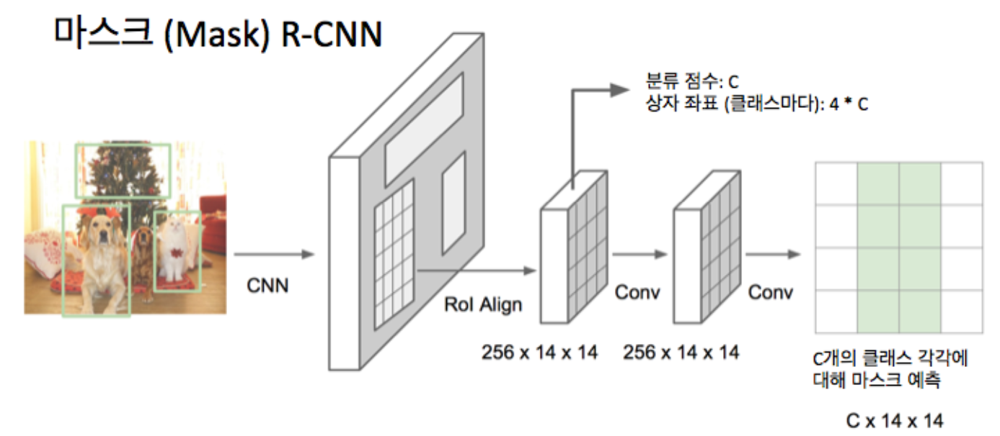

전체 입력 이미지를 받고,  
CNN과 어떤 학습된 영역제한 망으로 들어가고,  
영역 제안들 가각에 대해 분리 마스크를 예측

마스크 R-CNN은 정말 잘 작동하고 자세도 추정함  
자세를 추정할 때 추가해야 할 유일한 한 가지는 영역 제안 각각에 대해서 현재 영역 제안 인스턴스에 대해 관절들의 좌표를 예측하는 추가적인 가지를 더해야 한다.  
